# IMPORTANTE
### DOCUMENTACION AREPO : https://arepo-code.org/wp-content/userguide/snapshotformat.html

### DOCUMENTACION ILLUSTRIS: https://www.tng-project.org/data/docs/specifications/

In [1]:
import h5py

snap = h5py.File('/store/clues/HESTIA/RE_SIMS/8192/GAL_FOR/17_11/output_2x2.5Mpc/snapdir_127/snapshot_127.0.hdf5','r')

In [2]:
def printname(name):
    print (name)
snap.visit(printname)

Config
Header
Parameters
PartType0
PartType0/AllowRefinement
PartType0/Coordinates
PartType0/Density
PartType0/ElectronAbundance
PartType0/EnergyDissipation
PartType0/GFM_AGNRadiation
PartType0/GFM_CoolingRate
PartType0/GFM_Metallicity
PartType0/GFM_Metals
PartType0/GFM_RProcess
PartType0/GFM_WindDMVelDisp
PartType0/GFM_WindHostHaloMass
PartType0/HighResGasMass
PartType0/InternalEnergy
PartType0/Machnumber
PartType0/MagneticField
PartType0/MagneticFieldDivergence
PartType0/Masses
PartType0/NeutralHydrogenAbundance
PartType0/ParticleIDs
PartType0/Potential
PartType0/StarFormationRate
PartType0/Velocities
PartType1
PartType1/Coordinates
PartType1/Masses
PartType1/ParticleIDs
PartType1/Potential
PartType1/Velocities
PartType2
PartType2/Coordinates
PartType2/Masses
PartType2/ParticleIDs
PartType2/Potential
PartType2/Velocities
PartType3
PartType3/Coordinates
PartType3/Masses
PartType3/ParticleIDs
PartType3/Potential
PartType3/Velocities
PartType4
PartType4/BirthDensity
PartType4/BirthPos
P

### Particle Type

- PartType0 = Gas
- PartType1 = Halo (Dark Matter)
- PartType2 = Disk
- PartType3 = Bulge
- PartType4 = Star
- PartType5 = Bndry (Black Holes)

PartType 2 and 3 are not used

In [4]:
snap.get('Header').attrs.keys()


<KeysViewHDF5 ['BoxSize', 'Composition_vector_length', 'Flag_Cooling', 'Flag_DoublePrecision', 'Flag_Feedback', 'Flag_Metals', 'Flag_Sfr', 'Flag_StellarAge', 'Git_commit', 'Git_date', 'HubbleParam', 'MassTable', 'NumFilesPerSnapshot', 'NumPart_ThisFile', 'NumPart_Total', 'NumPart_Total_HighWord', 'Omega0', 'OmegaBaryon', 'OmegaLambda', 'Redshift', 'Time', 'UnitLength_in_cm', 'UnitMass_in_g', 'UnitVelocity_in_cm_per_s']>

In [4]:
list(snap.get('Parameters').attrs.keys())

['AGB_MassTransferOn',
 'ActivePartFracForNewDomainDecomp',
 'AdaptiveHydroSofteningSpacing',
 'BHFrictionAvgTime',
 'BHFrictionCoefficient',
 'BlackHoleAccretionFactor',
 'BlackHoleEddingtonFactor',
 'BlackHoleFeedbackFactor',
 'BlackHoleMaxAccretionRadius',
 'BlackHoleRadiativeEfficiency',
 'BoxSize',
 'CellMaxAngleFactor',
 'CellShapingSpeed',
 'ComovingIntegrationOn',
 'CoolingOn',
 'CoolingTablePath',
 'CourantFac',
 'CpuTimeBetRestartFile',
 'CritOverDensity',
 'CritPhysDensity',
 'DerefinementCriterion',
 'DesLinkNgb',
 'DesNumNgb',
 'DesNumNgbBlackHole',
 'DesNumNgbEnrichment',
 'ErrTolForceAcc',
 'ErrTolIntAccuracy',
 'ErrTolTheta',
 'ErrTolThetaSubfind',
 'FactorEVP',
 'GasSoftFactor',
 'GravityConstantInternal',
 'HubbleParam',
 'ICFormat',
 'IMF_MaxMass_Msun',
 'IMF_MinMass_Msun',
 'InitCondFile',
 'InitGasTemp',
 'LimitUBelowCertainDensityToThisValue',
 'LimitUBelowThisDensity',
 'MHDSeedDir',
 'MHDSeedValue',
 'MaxMemSize',
 'MaxNumNgbDeviation',
 'MaxNumNgbDeviationEnric

In [ ]:
om0= 

In [5]:
a =snap.get('Header').attrs['Time']
print (a)

0.9999999999999996


In [6]:
h =snap.get('Header').attrs['HubbleParam']
print (h)

0.6777


In [7]:
list(snap.items())

[('Config', <HDF5 group "/Config" (0 members)>),
 ('Header', <HDF5 group "/Header" (0 members)>),
 ('Parameters', <HDF5 group "/Parameters" (0 members)>),
 ('PartType0', <HDF5 group "/PartType0" (23 members)>),
 ('PartType1', <HDF5 group "/PartType1" (5 members)>),
 ('PartType2', <HDF5 group "/PartType2" (5 members)>),
 ('PartType3', <HDF5 group "/PartType3" (5 members)>),
 ('PartType4', <HDF5 group "/PartType4" (15 members)>),
 ('PartType5', <HDF5 group "/PartType5" (31 members)>),
 ('PartType6', <HDF5 group "/PartType6" (2 members)>)]

In [13]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [57]:
%%time
import gc
import joblib
import h5py
import pathlib
import numpy as np

dir_path = '/store/clues/HESTIA/RE_SIMS/8192/GAL_FOR/17_11/output_2x2.5Mpc/snapdir_127/'

pos_str = []
pos_drk = []
pos_gas = []
pos_ty2 = []
pos_ty3 = []
# vel_str = []

for i in range(0,8):
    snap = h5py.File(dir_path + 'snapshot_127.'+ str('%s'%i) +'.hdf5','r')
    
    pstr = snap['PartType4/Coordinates'][()]
    pdrk = snap['PartType1/Coordinates'][()]
    pgas = snap['PartType0/Coordinates'][()]
    pty2 = snap['PartType2/Coordinates'][()]
    pty3 = snap['PartType3/Coordinates'][()]
#     vstr = snap['PartType4/Velocities'][()]
    
    pos_str.append(pstr)
    pos_drk.append(pdrk)
    pos_gas.append(pgas)
    pos_ty2.append(pty2)
    pos_ty3.append(pty3)
#     vel_str.append(vstr)

pos_str = np.concatenate(pos_str)
pos_drk = np.concatenate(pos_drk)
pos_gas = np.concatenate(pos_gas)
pos_ty2 = np.concatenate(pos_ty2)
pos_ty3 = np.concatenate(pos_ty3)
# vel_str = np.concatenate(vel_str)

gc.collect()

CPU times: user 38.5 s, sys: 24.4 s, total: 1min 2s
Wall time: 16.5 s


0

In [58]:
xstr = pos_str[:,0]
ystr = pos_str[:,1]
zstr = pos_str[:,2]

xdrk = pos_drk[:,0]
ydrk = pos_drk[:,1]
zdrk = pos_drk[:,2]

xgas = pos_gas[:,0]
ygas = pos_gas[:,1]
zgas = pos_gas[:,2]

xty2 = pos_ty2[:,0]
yty2 = pos_ty2[:,1]
zty2 = pos_ty2[:,2]

xty3 = pos_ty3[:,0]
yty3 = pos_ty3[:,1]
zty3 = pos_ty3[:,2]
# r = np.sqrt(x**2 + y**2 + z**2)

# mask, = np.where(r<0.1)

CPU times: user 2min 16s, sys: 25.6 s, total: 2min 42s
Wall time: 57.5 s


(0, 100)

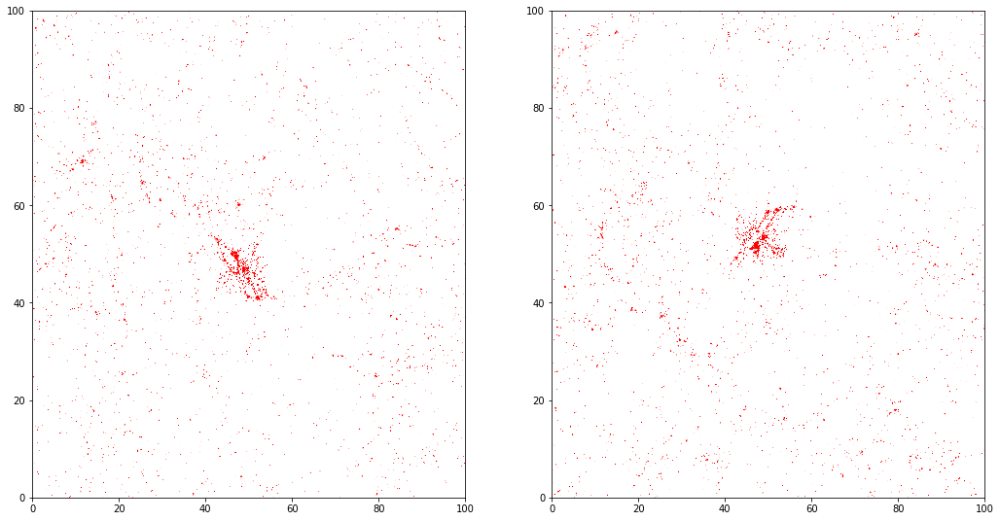

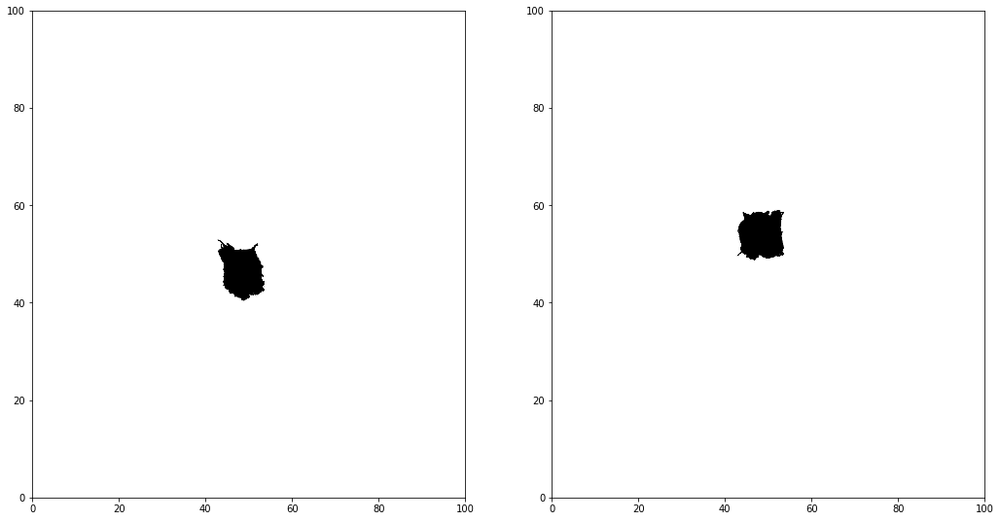

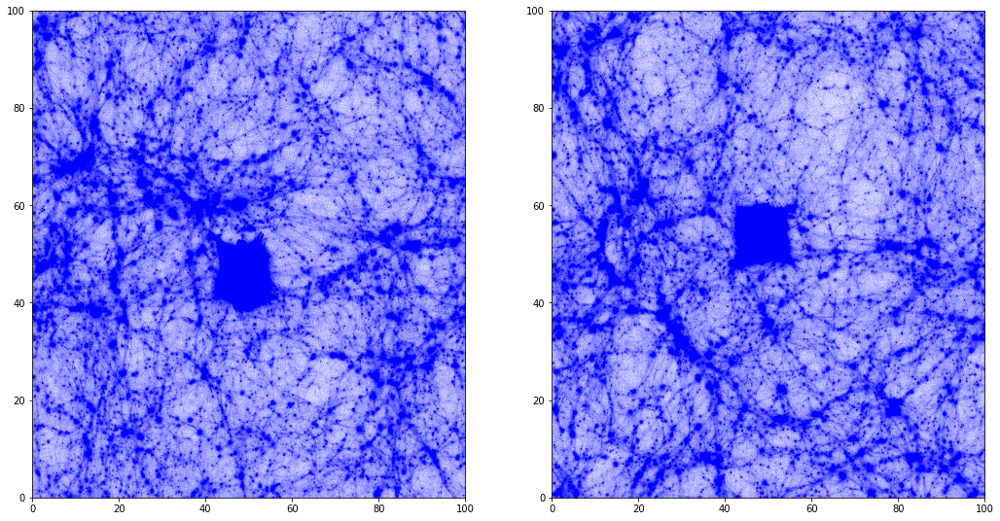

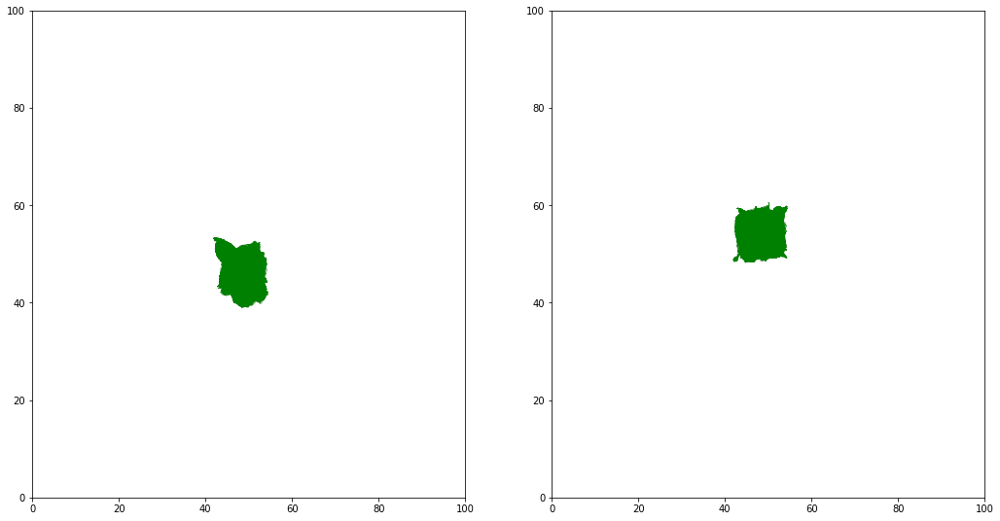

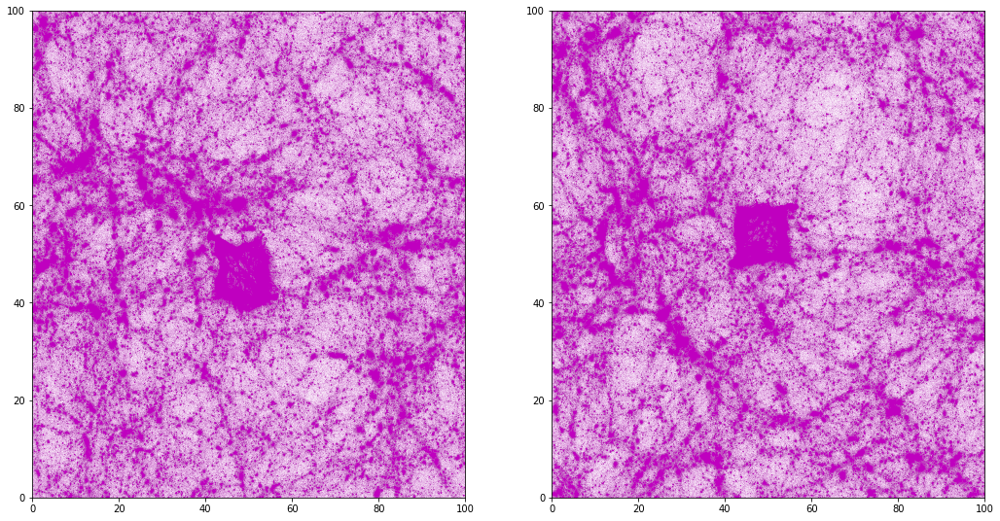

In [53]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)
ax[0].plot(xstr,ystr,'.r',markersize=0.008)
ax[0].set_xlim(0,100)
ax[0].set_ylim(0,100)

ax[1].plot(xstr,zstr,'.r',markersize=0.008)
ax[1].set_xlim(0,100)
ax[1].set_ylim(0,100)

#------------------------------------------------------------------------
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)
ax[0].plot(xdrk,ydrk,'.k',markersize=0.008)
ax[0].set_xlim(0,100)
ax[0].set_ylim(0,100)

ax[1].plot(xdrk,zdrk,'.k',markersize=0.008)
ax[1].set_xlim(0,100)
ax[1].set_ylim(0,100)

#------------------------------------------------------------------------
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)
ax[0].plot(xgas,ygas,'.b',markersize=0.008)
ax[0].set_xlim(0,100)
ax[0].set_ylim(0,100)

ax[1].plot(xgas,zgas,'.b',markersize=0.008)
ax[1].set_xlim(0,100)
ax[1].set_ylim(0,100)

#------------------------------------------------------------------------
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)
ax[0].plot(xty2,yty2,'.g',markersize=0.008)
ax[0].set_xlim(0,100)
ax[0].set_ylim(0,100)

ax[1].plot(xty2,zty2,'.g',markersize=0.008)
ax[1].set_xlim(0,100)
ax[1].set_ylim(0,100)

#------------------------------------------------------------------------
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)
ax[0].plot(xty3,yty3,'.m',markersize=0.008)
ax[0].set_xlim(0,100)
ax[0].set_ylim(0,100)

ax[1].plot(xty3,zty3,'.m',markersize=0.008)
ax[1].set_xlim(0,100)
ax[1].set_ylim(0,100)

In [59]:
xstr = pos_str[:,0]
ystr = pos_str[:,1]
zstr = pos_str[:,2]
mask_str, = np.where((xstr<60) & (xstr>40) & (ystr<55) & (ystr>35) & (zstr<65) & (zstr>45))

xdrk = pos_drk[:,0]
ydrk = pos_drk[:,1]
zdrk = pos_drk[:,2]
mask_drk, = np.where((xdrk<60) & (xdrk>40) & (ydrk<55) & (ydrk>35) & (zdrk<65) & (zdrk>45))

xgas = pos_gas[:,0]
ygas = pos_gas[:,1]
zgas = pos_gas[:,2]
mask_gas, = np.where((xgas<60) & (xgas>40) & (ygas<55) & (ygas>35) & (zgas<65) & (zgas>45))

xty2 = pos_ty2[:,0]
yty2 = pos_ty2[:,1]
zty2 = pos_ty2[:,2]
mask_ty2, = np.where((xty2<60) & (xty2>40) & (yty2<55) & (yty2>35) & (zty2<65) & (zty2>45))

xty3 = pos_ty3[:,0]
yty3 = pos_ty3[:,1]
zty3 = pos_ty3[:,2]
mask_ty3, = np.where((xty3<60) & (xty3>40) & (yty3<55) & (yty3>35) & (zty3<65) & (zty3>45))



In [7]:
xstr = pos_str[:,0]
ystr = pos_str[:,1]
zstr = pos_str[:,2]
mask_str, = np.where((xstr<51) & (xstr>48) & (ystr<47) & (ystr>44) & (zstr<55) & (zstr>52))

xdrk = pos_drk[:,0]
ydrk = pos_drk[:,1]
zdrk = pos_drk[:,2]
mask_drk, = np.where((xdrk<51) & (xdrk>48) & (ydrk<47) & (ydrk>44) & (zdrk<55) & (zdrk>52))

xgas = pos_gas[:,0]
ygas = pos_gas[:,1]
zgas = pos_gas[:,2]
mask_gas, = np.where((xgas<51) & (xgas>48) & (ygas<47) & (ygas>44) & (zgas<55) & (zgas>52))

xty2 = pos_ty2[:,0]
yty2 = pos_ty2[:,1]
zty2 = pos_ty2[:,2]
mask_ty2, = np.where((xty2<51) & (xty2>48) & (yty2<47) & (yty2>44) & (zty2<55) & (zty2>52))

xty3 = pos_ty3[:,0]
yty3 = pos_ty3[:,1]
zty3 = pos_ty3[:,2]
mask_ty3, = np.where((xty3<51) & (xty3>48) & (yty3<47) & (yty3>44) & (zty3<55) & (zty3>52))



In [8]:
print (len(mask_str))
print (len(mask_drk))
print (len(mask_gas))
print (len(mask_ty2))
print (len(mask_ty3))

6330459
27989395
22633494
10213
0


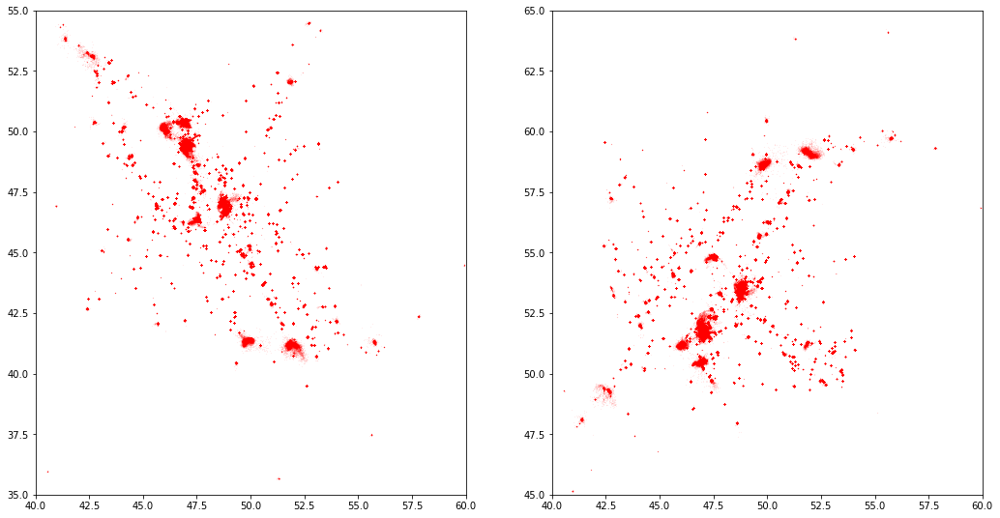

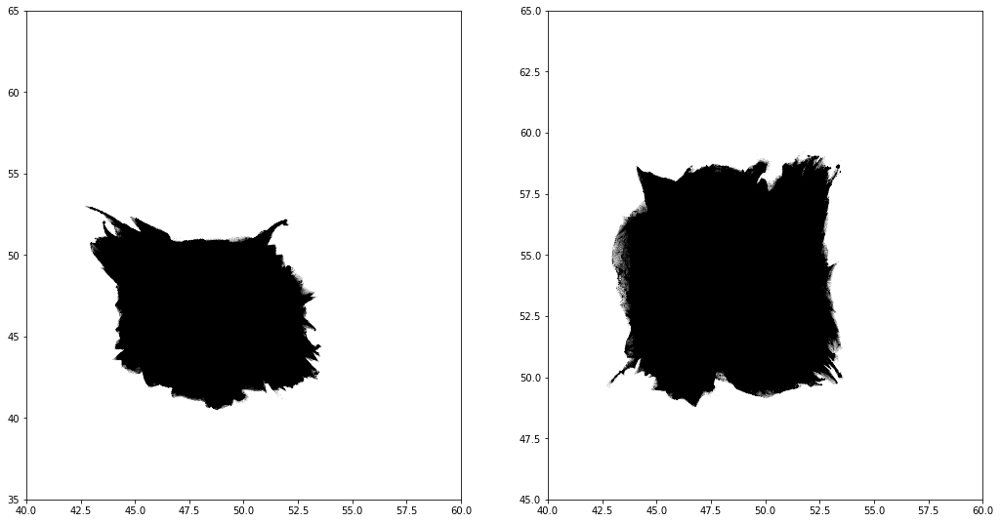

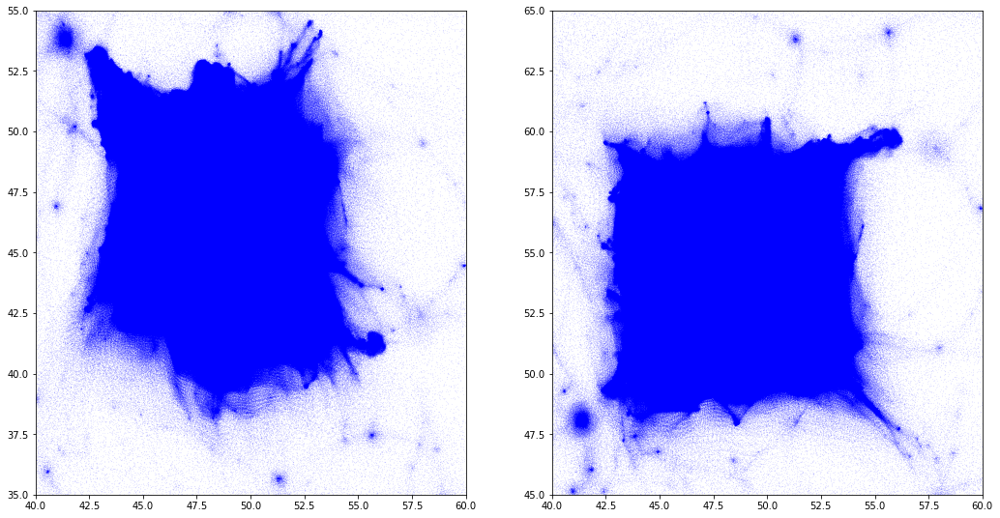

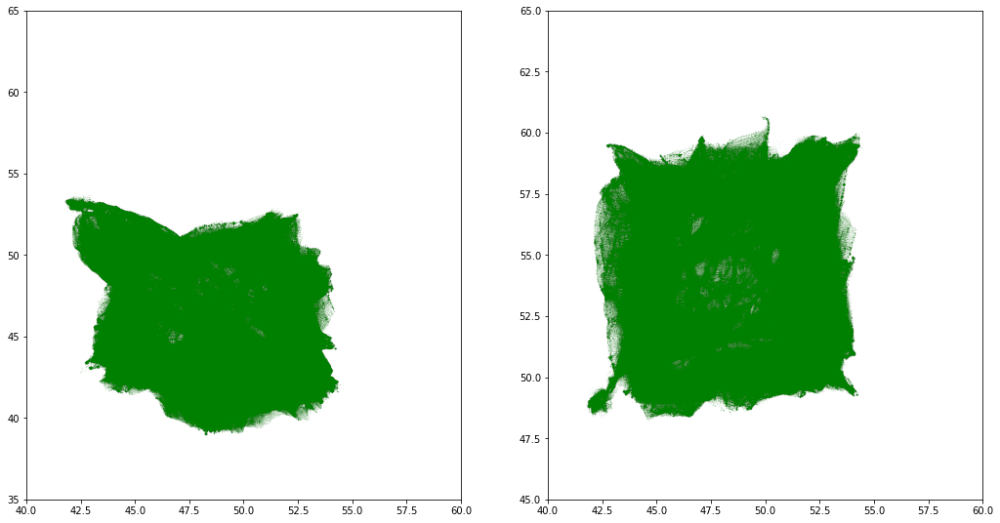

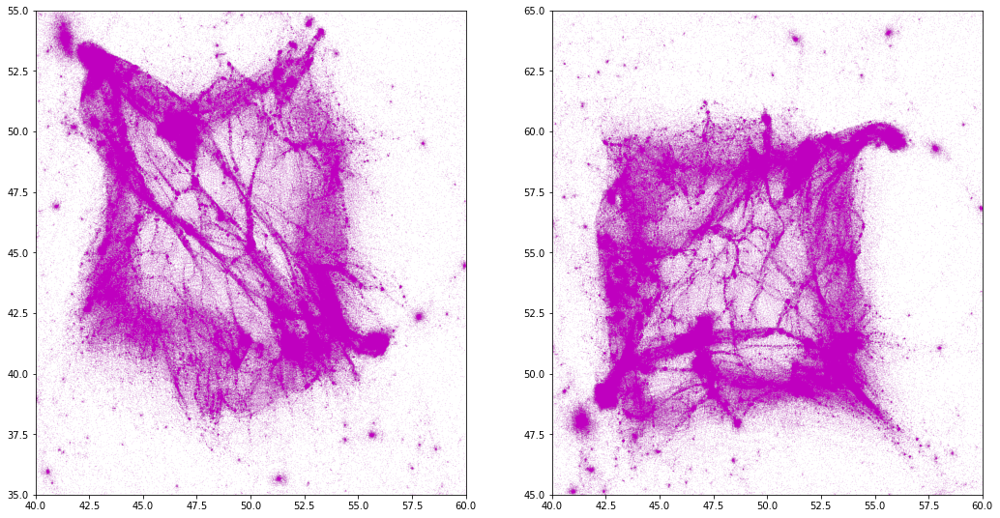

CPU times: user 15min 12s, sys: 32.6 s, total: 15min 44s
Wall time: 13min 58s


In [60]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)
ax[0].plot(xstr[mask_str],ystr[mask_str],'.r',markersize=0.05)
ax[0].set_xlim(40,60)
ax[0].set_ylim(35,55)

ax[1].plot(xstr[mask_str],zstr[mask_str],'.r',markersize=0.05)
ax[1].set_xlim(40,60)
ax[1].set_ylim(45,65)

#------------------------------------------------------------------------
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)
ax[0].plot(xdrk[mask_drk],ydrk[mask_drk],'.k',markersize=0.05)
ax[0].set_xlim(40,60)
ax[0].set_ylim(35,65)

ax[1].plot(xdrk[mask_drk],zdrk[mask_drk],'.k',markersize=0.05)
ax[1].set_xlim(40,60)
ax[1].set_ylim(45,65)

#------------------------------------------------------------------------
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)
ax[0].plot(xgas[mask_gas],ygas[mask_gas],'.b',markersize=0.05)
ax[0].set_xlim(40,60)
ax[0].set_ylim(35,55)

ax[1].plot(xgas[mask_gas],zgas[mask_gas],'.b',markersize=0.05)
ax[1].set_xlim(40,60)
ax[1].set_ylim(45,65)

#------------------------------------------------------------------------
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)
ax[0].plot(xty2[mask_ty2],yty2[mask_ty2],'.g',markersize=0.05)
ax[0].set_xlim(40,60)
ax[0].set_ylim(35,65)

ax[1].plot(xty2[mask_ty2],zty2[mask_ty2],'.g',markersize=0.05)
ax[1].set_xlim(40,60)
ax[1].set_ylim(45,65)

#------------------------------------------------------------------------
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)
ax[0].plot(xty3[mask_ty3],yty3[mask_ty3],'.m',markersize=0.05)
ax[0].set_xlim(40,60)
ax[0].set_ylim(35,55)

ax[1].plot(xty3[mask_ty3],zty3[mask_ty3],'.m',markersize=0.05)
ax[1].set_xlim(40,60)
ax[1].set_ylim(45,65)
plt.show()

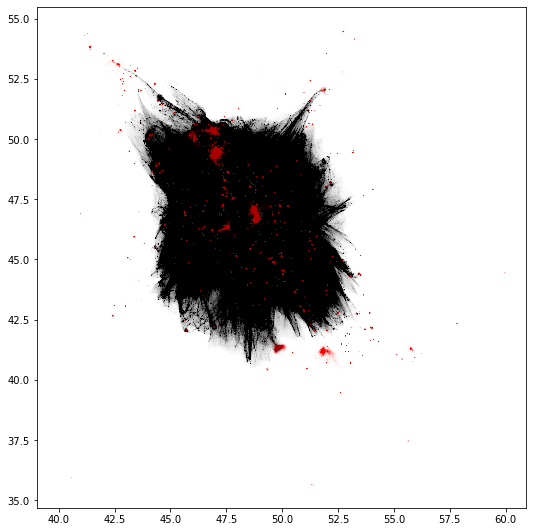

CPU times: user 2min 44s, sys: 7.13 s, total: 2min 51s
Wall time: 2min 27s


In [62]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xdrk[mask_drk],ydrk[mask_drk],'.k',markersize=0.005)
# ax.plot(xgas[mask_gas],ygas[mask_gas],'.b',markersize=0.008)
ax.plot(xstr[mask_str],ystr[mask_str],'.r',markersize=0.008)
# ax.set_xlim(40,60)
# ax.set_ylim(38,55)

plt.show()

### Aca empiezo a mirar los subhalos

In [11]:
import h5py
subhalo = h5py.File('/store/clues/HESTIA/RE_SIMS/8192/GAL_FOR/17_11/output_2x2.5Mpc/groups_127/fof_subhalo_tab_127.0.hdf5','r')

In [18]:
list(subhalo.get('Header').attrs.keys())

['BoxSize',
 'FlagDoubleprecision',
 'Git_commit',
 'Git_date',
 'HubbleParam',
 'Ngroups_ThisFile',
 'Ngroups_Total',
 'Nids_ThisFile',
 'Nids_Total',
 'Nsubgroups_ThisFile',
 'Nsubgroups_Total',
 'NumFiles',
 'Omega0',
 'OmegaLambda',
 'Redshift',
 'Time']

In [19]:
def printname(name):
    print (name)
subhalo.visit(printname)

Config
Group
Group/GroupBHMass
Group/GroupBHMdot
Group/GroupCM
Group/GroupFirstSub
Group/GroupGasMetalFractions
Group/GroupGasMetallicity
Group/GroupLen
Group/GroupLenType
Group/GroupMass
Group/GroupMassType
Group/GroupNsubs
Group/GroupPos
Group/GroupRadioLuminosity
Group/GroupSFR
Group/GroupStarMetalFractions
Group/GroupStarMetallicity
Group/GroupVel
Group/GroupWindMass
Group/GroupXrayLuminosity
Group/Group_M_Crit200
Group/Group_M_Crit500
Group/Group_M_Mean200
Group/Group_M_TopHat200
Group/Group_R_Crit200
Group/Group_R_Crit500
Group/Group_R_Mean200
Group/Group_R_TopHat200
Header
IDs
Parameters
Subhalo
Subhalo/SubhaloBHMass
Subhalo/SubhaloBHMdot
Subhalo/SubhaloBfldDisk
Subhalo/SubhaloBfldHalo
Subhalo/SubhaloCM
Subhalo/SubhaloGasMetalFractions
Subhalo/SubhaloGasMetalFractionsHalfRad
Subhalo/SubhaloGasMetalFractionsMaxRad
Subhalo/SubhaloGasMetalFractionsSfr
Subhalo/SubhaloGasMetalFractionsSfrWeighted
Subhalo/SubhaloGasMetallicity
Subhalo/SubhaloGasMetallicityHalfRad
Subhalo/SubhaloGasMet

In [15]:
import numpy as np
sub_mass_type = subhalo['Subhalo/SubhaloMassType'][()]

print (np.shape(sub_mass_type))
print (sub_mass_type[4].max())

(3190, 7)
1.2963216


In [45]:
%%time
import gc
import joblib
import h5py
import pathlib
import numpy as np 


dir_path = '/store/clues/HESTIA/RE_SIMS/8192/GAL_FOR/17_11/output_2x2.5Mpc/groups_127/'

GroupPos  = []
GroupMass = []
GroupM200 = []
GroupR200 = []
GroupNsub = []

SubhMass = []
SubhPos  = []

for i in range(0,8):
    
    snap = h5py.File(dir_path + 'fof_subhalo_tab_127.'+ str('%s'%i) +'.hdf5','r')
    
    g_pos  = snap['Group/GroupPos'][()]
    g_mass = snap['Group/GroupMass'][()]
    g_M200 = snap['Group/Group_M_Crit200'][()]
    g_R200 = snap['Group/Group_R_Crit200'][()]
    g_Nsub = snap['Group/GroupNsubs'][()]

    sub_mass = snap['Subhalo/SubhaloMass'][()]
    sub_pos  = snap['Subhalo/SubhaloPos'][()]

    GroupPos.append(g_pos)
    GroupMass.append(g_mass)
    GroupM200.append(g_M200)
    GroupR200.append(g_R200)
    GroupNsub.append(g_Nsub)

    SubhMass.append(sub_mass)
    SubhPos.append(sub_pos)

GroupPos  = np.concatenate(GroupPos)
GroupMass = np.concatenate(GroupMass)
GroupM200 = np.concatenate(GroupM200)
GroupR200 = np.concatenate(GroupR200)
GroupNsub = np.concatenate(GroupNsub)

SubhMass = np.concatenate(SubhMass)
SubhPos  = np.concatenate(SubhPos)

gc.collect()

CPU times: user 147 ms, sys: 84.6 ms, total: 232 ms
Wall time: 1.25 s


11070

In [5]:
a =snap.get('Header').attrs['Time']
print (a)

0.9999999999999996


#### Ordeno por masa fof

In [47]:
import numpy as np

print (np.shape(GroupPos))

sort_g0 = np.argsort(GroupMass)

print (GroupMass)

G_Mass0 = GroupMass[sort_g0][::-1]*1e10
print (G_Mass[:5])

G_Pos0 = GroupPos[sort_g0][::-1]
print (G_Pos[:5,:])

Gr200_0 = GroupR200[sort_g0][::-1]
print (Gr200[:5])

G_NSUB0 = GroupNsub[sort_g0][::-1]
print (G_NSUB[:5])

(132641, 3)
[3.1762277e+02 1.8560672e+02 5.9188957e+01 ... 4.3620571e-04 4.3620571e-04
 4.3620571e-04]
[3.1762277e+12 1.8560672e+12 5.9188956e+11 5.0323944e+11 2.3956097e+11]
[[46.974728 49.455475 51.771206]
 [46.952423 50.50312  50.489742]
 [48.81521  46.704514 53.605064]
 [46.062164 50.05576  51.221386]
 [49.73617  41.36179  58.553463]]
[0.25368485 0.22688101 0.18895945 0.16649212 0.13574608]
[1581  137 3190   13    2]


#### Ordeno por M200

In [27]:
import numpy as np

print (np.shape(GroupPos))

sort_g = np.argsort(GroupM200)

G_M200 = GroupM200[sort_g][::-1]*1e10
print (G_Mass[:5])

G_Pos = GroupPos[sort_g][::-1]
print (G_Pos[:5,:])

Gr200 = GroupR200[sort_g][::-1]
print (Gr200[:5])

G_NSUB = GroupNsub[sort_g][::-1]
print (G_NSUB[:5])

(132641, 3)
[3.1762277e+12 1.8560672e+12 5.9188956e+11 5.0323944e+11 2.3956097e+11]
[[46.974728 49.455475 51.771206]
 [46.952423 50.50312  50.489742]
 [48.81521  46.704514 53.605064]
 [46.062164 50.05576  51.221386]
 [49.73617  41.36179  58.553463]]
[0.25368485 0.22688101 0.18895945 0.16649212 0.13574608]
[1581  137 3190   13    2]


In [11]:
import numpy as np

print (np.shape(SubhPos))

sort = np.argsort(SubhMass)

SMass = SubhMass[sort][::-1]*1e10
print (SMass[:5])

(81461, 3)
[1.5752759e+12 1.1699873e+12 5.7578933e+11 5.5521280e+11 2.3570245e+11]


In [12]:
# SCM  = Scm[sort][::-1]
SPOS = SubhPos[sort][::-1]

# print (SCM[:20,:])
# print ('-----')
print (SPOS[:5,:])

[[48.81521  46.704514 53.605064]
 [48.71576  47.06235  53.33718 ]
 [46.974728 49.455475 51.771206]
 [47.528534 46.364803 54.832882]
 [47.325207 47.259197 51.91327 ]]


In [18]:
%%time
import random
adrk = random.choices(np.arange(len(xdrk[mask_drk])),k=np.int(len(xdrk[mask_drk])*0.001)) 
astr = random.choices(np.arange(len(xstr[mask_str])),k=np.int(len(xstr[mask_str])*0.001)) 
agas = random.choices(np.arange(len(xgas[mask_gas])),k=np.int(len(xgas[mask_gas])*0.001)) 


CPU times: user 4.14 s, sys: 1.62 s, total: 5.76 s
Wall time: 5.76 s


In [9]:
%matplotlib widget


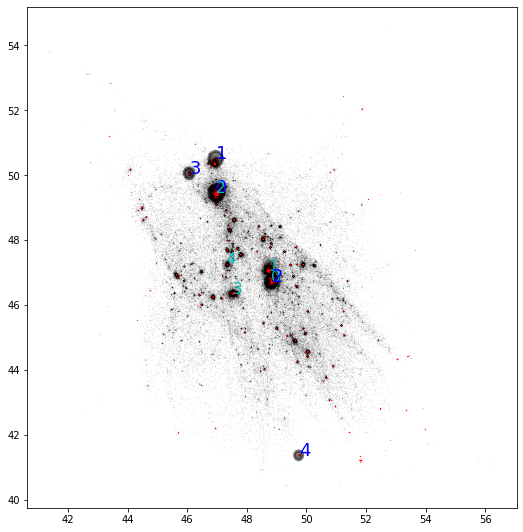

CPU times: user 16.8 s, sys: 858 ms, total: 17.6 s
Wall time: 11.5 s


In [30]:
%%time 
import matplotlib.pyplot as plt

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xdrk[mask_drk][adrk],ydrk[mask_drk][adrk],'.k',markersize=0.05,alpha=0.7)
# ax.plot(xgas[agas],ygas[agas],'.b',markersize=0.008)
ax.plot(xstr[mask_str][astr],ystr[mask_str][astr],'.r',markersize=0.08)
# ax.set_xlim(46,50)
# ax.set_ylim(46,50)
for i in range(0,20):
    ax.text(SPOS[i,0],SPOS[i,1],str('%s'%i),fontsize=15,color='c')
#     ax.text(G_Pos[i,0],G_Pos[i,1],str('%s'%i),fontsize=18,color='b')
    circle1= plt.Circle((G_Pos[i,0],G_Pos[i,1]),radius=Gr200[i],lw=3,ls='-',color='k',alpha=0.5)
    ax.add_artist(circle1)
plt.show()
fig.savefig('../_imagenes/subhalos.pdf', dpi = 100, xxbox_inches='tight')

# Grafico el primer halo mas masivo

In [39]:
CM1  = SPOS[0,:]
SUB1 = SMass[0]

print('mass=',SUB1,'CM=',CM1)

mass= 1575275900000.0 CM= [48.81521  46.704514 53.605064]


In [40]:
xstr1 = pos_str[:,0]-CM1[0]
ystr1 = pos_str[:,1]-CM1[1]
zstr1 = pos_str[:,2]-CM1[2]

xdrk1 = pos_drk[:,0]-CM1[0]
ydrk1 = pos_drk[:,1]-CM1[1]
zdrk1 = pos_drk[:,2]-CM1[2]

xgas1 = pos_gas[:,0]-CM1[0]
ygas1 = pos_gas[:,1]-CM1[1]
zgas1 = pos_gas[:,2]-CM1[2]

In [41]:
rstr = np.sqrt(xstr1**2 + ystr1**2 + zstr1**2)
rdrk = np.sqrt(xdrk1**2 + ydrk1**2 + zdrk1**2)
rgas = np.sqrt(xgas1**2 + ygas1**2 + zgas1**2)

mask_str, = np.where(rstr<1)
mask_drk, = np.where(rdrk<1)
mask_gas, = np.where(rgas<1)

CPU times: user 23.8 s, sys: 2.66 s, total: 26.4 s
Wall time: 4.2 s


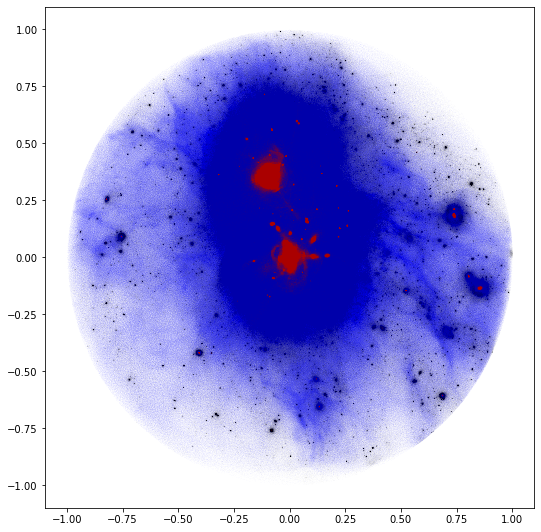

In [42]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xdrk1[mask_drk],ydrk1[mask_drk],'.k',markersize=0.005)
ax.plot(xgas1[mask_gas],ygas1[mask_gas],'.b',markersize=0.008)
ax.plot(xstr1[mask_str],ystr1[mask_str],'.r',markersize=0.008)


In [43]:
rstr = np.sqrt(xstr1**2 + ystr1**2 + zstr1**2)
rdrk = np.sqrt(xdrk1**2 + ydrk1**2 + zdrk1**2)
rgas = np.sqrt(xgas1**2 + ygas1**2 + zgas1**2)

mask_str, = np.where(rstr<0.25)
mask_drk, = np.where(rdrk<0.25)
mask_gas, = np.where(rgas<0.25)

CPU times: user 19.8 s, sys: 1.53 s, total: 21.3 s
Wall time: 1.68 s


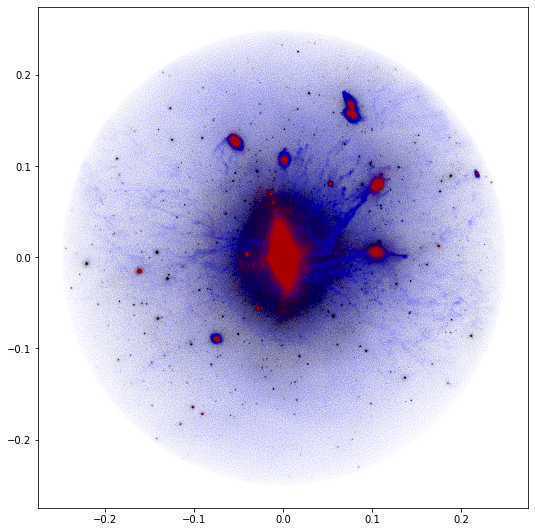

In [44]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xdrk1[mask_drk],ydrk1[mask_drk],'.k',markersize=0.005)
ax.plot(xgas1[mask_gas],ygas1[mask_gas],'.b',markersize=0.008)
ax.plot(xstr1[mask_str],ystr1[mask_str],'.r',markersize=0.008)


In [45]:
rstr = np.sqrt(xstr1**2 + ystr1**2 + zstr1**2)
rdrk = np.sqrt(xdrk1**2 + ydrk1**2 + zdrk1**2)
rgas = np.sqrt(xgas1**2 + ygas1**2 + zgas1**2)

mask_str, = np.where(rstr<0.05)
mask_drk, = np.where(rdrk<0.05)
mask_gas, = np.where(rgas<0.05)

In [54]:
import rotation_mio as rot

mstr = MASS4[mask_str]
v_x = vel_str[:,0][mask_str]
v_y = vel_str[:,1][mask_str]
v_z = vel_str[:,2][mask_str]

veloc,=np.where(rstr[mask_str]<0.005)

#----------componentes de la velocidad del centro de masa------------
vxcm = sum(mstr[veloc]*v_x[veloc])/sum(mstr[veloc])
vycm = sum(mstr[veloc]*v_y[veloc])/sum(mstr[veloc])
vzcm = sum(mstr[veloc]*v_z[veloc])/sum(mstr[veloc])

#----- velocidades de las estrellas respecto del centro de masa de la galaxia---------
vx = v_x - vxcm
vy = v_y - vycm
vz = v_z - vzcm

e1x,e2x,e3x,e1y,e2y,e3y,e1z,e2z,e3z = rot.rot1(mstr,xstr1[mask_str],ystr1[mask_str],zstr1[mask_str],vx,vy,vz,0.005)

xn_str = e1x*xstr1[mask_str] + e1y*ystr1[mask_str] + e1z*zstr1[mask_str]
yn_str = e2x*xstr1[mask_str] + e2y*ystr1[mask_str] + e2z*zstr1[mask_str]
zn_str = e3x*xstr1[mask_str] + e3y*ystr1[mask_str] + e3z*zstr1[mask_str]
# vxn_str = e1x*vx[mask_str] + e1y*vy[mask_str] + e1z*vz[mask_str]
# vyn_str = e2x*vx[mask_str] + e2y*vy[mask_str] + e2z*vz[mask_str]
# vzn_str = e3x*vx[mask_str] + e3y*vy[mask_str] + e3z*vz[mask_str]

xn_gas = e1x*xgas1[mask_gas] + e1y*ygas1[mask_gas] + e1z*zgas1[mask_gas]
yn_gas = e2x*xgas1[mask_gas] + e2y*ygas1[mask_gas] + e2z*zgas1[mask_gas]
zn_gas = e3x*xgas1[mask_gas] + e3y*ygas1[mask_gas] + e3z*zgas1[mask_gas]

xn_drk = e1x*xdrk1[mask_drk] + e1y*ydrk1[mask_drk] + e1z*zdrk1[mask_drk]
yn_drk = e2x*xdrk1[mask_drk] + e2y*ydrk1[mask_drk] + e2z*zdrk1[mask_drk]
zn_drk = e3x*xdrk1[mask_drk] + e3y*ydrk1[mask_drk] + e3z*zdrk1[mask_drk]

#  z = a0/aexp[isnap] - 1.
#         Ht = H0*np.sqrt(omega_lambda+(1-omega0)*(1+z)**2+omega_matter*(1+z)**3)
#         time = tiempo.conv(z, h, omega_lambda, omega_matter)
        
# #---aca paso las coordenadas respecto al centro de la galaxia------
#         xstr = (pstr[:,0]-cm[0])*aexp[isnap]/h
#         ystr = (pstr[:,1]-cm[1])*aexp[isnap]/h
#         zstr = (pstr[:,2]-cm[2])*aexp[isnap]/h
#         r = np.sqrt(xstr**2+ystr**2+zstr**2)
         
#         v_x = vel[:,0] *np.sqrt(aexp[isnap]) + Ht *xstr/1000.
#         v_y = vel[:,1] *np.sqrt(aexp[isnap]) + Ht *ystr/1000.
#         v_z = vel[:,2] *np.sqrt(aexp[isnap]) + Ht *zstr/1000.

CPU times: user 18.1 s, sys: 2.88 s, total: 21 s
Wall time: 1.71 s


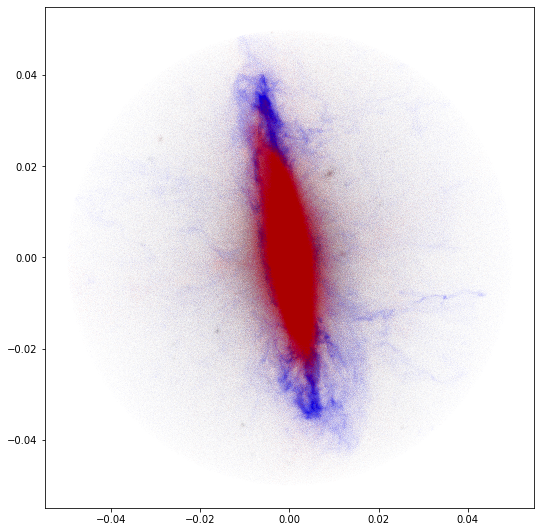

In [49]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xdrk1[mask_drk],ydrk1[mask_drk],'.k',markersize=0.005)
ax.plot(xgas1[mask_gas],ygas1[mask_gas],'.b',markersize=0.008)
ax.plot(xstr1[mask_str],ystr1[mask_str],'.r',markersize=0.008)



CPU times: user 18.1 s, sys: 2.5 s, total: 20.6 s
Wall time: 1.25 s


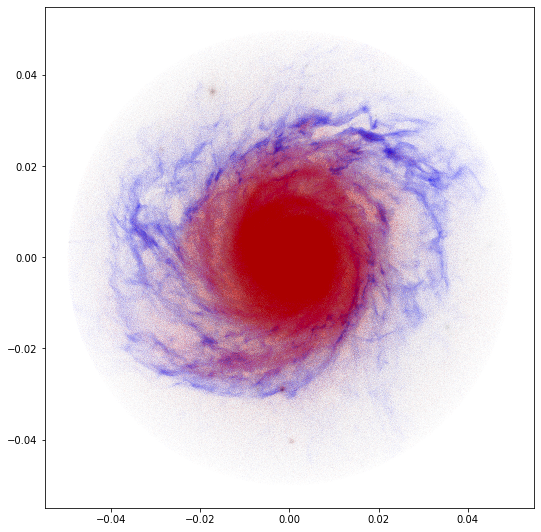

In [55]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xn_drk,yn_drk,'.k',markersize=0.005)
ax.plot(xn_gas,yn_gas,'.b',markersize=0.008)
ax.plot(xn_str,yn_str,'.r',markersize=0.008)



CPU times: user 18.1 s, sys: 2.33 s, total: 20.4 s
Wall time: 1.12 s


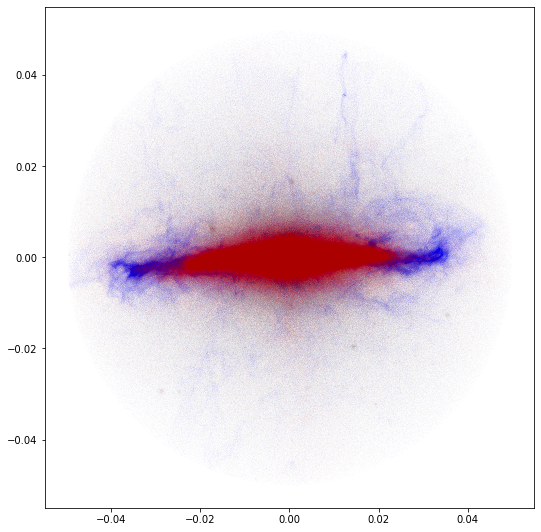

In [56]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xn_drk,zn_drk,'.k',markersize=0.005)
ax.plot(xn_gas,zn_gas,'.b',markersize=0.008)
ax.plot(xn_str,zn_str,'.r',markersize=0.008)



# Grafico el segundo halo mas masivo

In [57]:
CM2  = SPOS[1,:]
SUB2 = SMass[1]

print('mass=',SUB2,'CM=',CM2)

mass= 1169987300000.0 CM= [48.71576 47.06235 53.33718]


In [58]:
xstr2 = pos_str[:,0]-CM2[0]
ystr2 = pos_str[:,1]-CM2[1]
zstr2 = pos_str[:,2]-CM2[2]

xdrk2 = pos_drk[:,0]-CM2[0]
ydrk2 = pos_drk[:,1]-CM2[1]
zdrk2 = pos_drk[:,2]-CM2[2]

xgas2 = pos_gas[:,0]-CM2[0]
ygas2 = pos_gas[:,1]-CM2[1]
zgas2 = pos_gas[:,2]-CM2[2]

In [30]:
rstr = np.sqrt(xstr2**2 + ystr2**2 + zstr2**2)
rdrk = np.sqrt(xdrk2**2 + ydrk2**2 + zdrk2**2)
rgas = np.sqrt(xgas2**2 + ygas2**2 + zgas2**2)

mask_str, = np.where(rstr<1)
mask_drk, = np.where(rdrk<1)
mask_gas, = np.where(rgas<1)

CPU times: user 15.1 s, sys: 5.53 s, total: 20.6 s
Wall time: 4.64 s


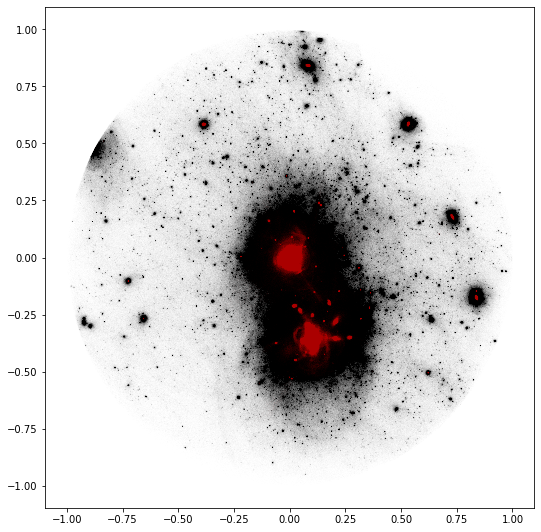

In [31]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xdrk2[mask_drk],ydrk2[mask_drk],'.k',markersize=0.005)
ax.plot(xstr2[mask_str],ystr2[mask_str],'.r',markersize=0.01)


In [59]:
rstr = np.sqrt(xstr2**2 + ystr2**2 + zstr2**2)
rdrk = np.sqrt(xdrk2**2 + ydrk2**2 + zdrk2**2)
rgas = np.sqrt(xgas2**2 + ygas2**2 + zgas2**2)

mask_str, = np.where(rstr<0.25)
mask_drk, = np.where(rdrk<0.25)
mask_gas, = np.where(rgas<0.25)

CPU times: user 19 s, sys: 3.7 s, total: 22.7 s
Wall time: 2.64 s


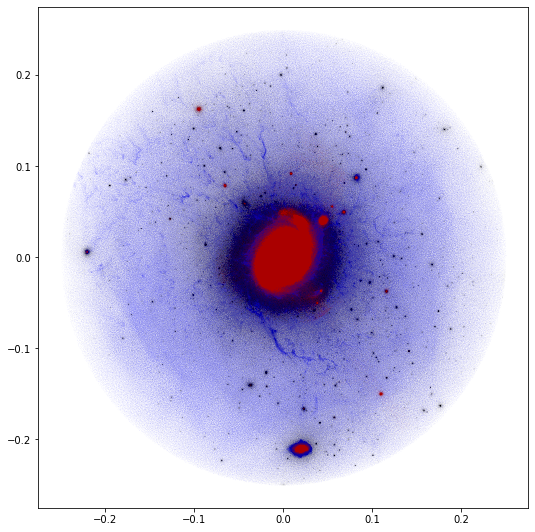

In [60]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xdrk2[mask_drk],ydrk2[mask_drk],'.k',markersize=0.005)
ax.plot(xgas2[mask_gas],ygas2[mask_gas],'.b',markersize=0.008)
ax.plot(xstr2[mask_str],ystr2[mask_str],'.r',markersize=0.008)


In [61]:
rstr = np.sqrt(xstr2**2 + ystr2**2 + zstr2**2)
rdrk = np.sqrt(xdrk2**2 + ydrk2**2 + zdrk2**2)
rgas = np.sqrt(xgas2**2 + ygas2**2 + zgas2**2)

mask_str, = np.where(rstr<0.05)
mask_drk, = np.where(rdrk<0.05)
mask_gas, = np.where(rgas<0.05)

CPU times: user 18.1 s, sys: 2.59 s, total: 20.7 s
Wall time: 1.43 s


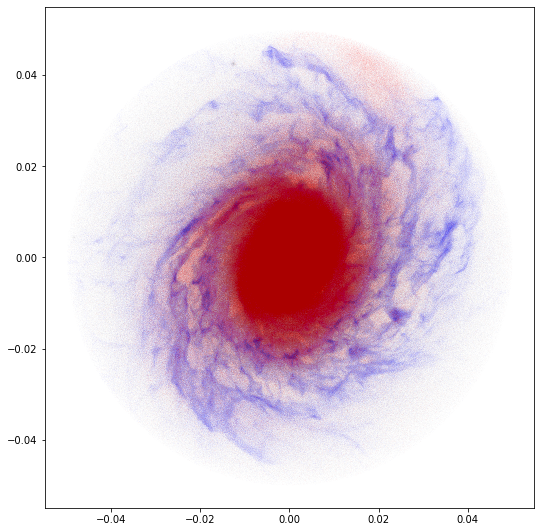

In [62]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xdrk2[mask_drk],ydrk2[mask_drk],'.k',markersize=0.005)
ax.plot(xgas2[mask_gas],ygas2[mask_gas],'.b',markersize=0.008)
ax.plot(xstr2[mask_str],ystr2[mask_str],'.r',markersize=0.008)


In [63]:
import rotation_mio as rot

mstr = MASS4[mask_str]
v_x = vel_str[:,0][mask_str]
v_y = vel_str[:,1][mask_str]
v_z = vel_str[:,2][mask_str]

veloc,=np.where(rstr[mask_str]<0.005)

#----------componentes de la velocidad del centro de masa------------
vxcm = sum(mstr[veloc]*v_x[veloc])/sum(mstr[veloc])
vycm = sum(mstr[veloc]*v_y[veloc])/sum(mstr[veloc])
vzcm = sum(mstr[veloc]*v_z[veloc])/sum(mstr[veloc])

#----- velocidades de las estrellas respecto del centro de masa de la galaxia---------
vx = v_x - vxcm
vy = v_y - vycm
vz = v_z - vzcm

e1x,e2x,e3x,e1y,e2y,e3y,e1z,e2z,e3z = rot.rot1(mstr,xstr2[mask_str],ystr2[mask_str],zstr2[mask_str],vx,vy,vz,0.005)

xn_str = e1x*xstr2[mask_str] + e1y*ystr2[mask_str] + e1z*zstr2[mask_str]
yn_str = e2x*xstr2[mask_str] + e2y*ystr2[mask_str] + e2z*zstr2[mask_str]
zn_str = e3x*xstr2[mask_str] + e3y*ystr2[mask_str] + e3z*zstr2[mask_str]
# vxn_str = e1x*vx[mask_str] + e1y*vy[mask_str] + e1z*vz[mask_str]
# vyn_str = e2x*vx[mask_str] + e2y*vy[mask_str] + e2z*vz[mask_str]
# vzn_str = e3x*vx[mask_str] + e3y*vy[mask_str] + e3z*vz[mask_str]

xn_gas = e1x*xgas2[mask_gas] + e1y*ygas2[mask_gas] + e1z*zgas2[mask_gas]
yn_gas = e2x*xgas2[mask_gas] + e2y*ygas2[mask_gas] + e2z*zgas2[mask_gas]
zn_gas = e3x*xgas2[mask_gas] + e3y*ygas2[mask_gas] + e3z*zgas2[mask_gas]

xn_drk = e1x*xdrk2[mask_drk] + e1y*ydrk2[mask_drk] + e1z*zdrk2[mask_drk]
yn_drk = e2x*xdrk2[mask_drk] + e2y*ydrk2[mask_drk] + e2z*zdrk2[mask_drk]
zn_drk = e3x*xdrk2[mask_drk] + e3y*ydrk2[mask_drk] + e3z*zdrk2[mask_drk]

#  z = a0/aexp[isnap] - 1.
#         Ht = H0*np.sqrt(omega_lambda+(1-omega0)*(1+z)**2+omega_matter*(1+z)**3)
#         time = tiempo.conv(z, h, omega_lambda, omega_matter)
        
# #---aca paso las coordenadas respecto al centro de la galaxia------
#         xstr = (pstr[:,0]-cm[0])*aexp[isnap]/h
#         ystr = (pstr[:,1]-cm[1])*aexp[isnap]/h
#         zstr = (pstr[:,2]-cm[2])*aexp[isnap]/h
#         r = np.sqrt(xstr**2+ystr**2+zstr**2)
         
#         v_x = vel[:,0] *np.sqrt(aexp[isnap]) + Ht *xstr/1000.
#         v_y = vel[:,1] *np.sqrt(aexp[isnap]) + Ht *ystr/1000.
#         v_z = vel[:,2] *np.sqrt(aexp[isnap]) + Ht *zstr/1000.

CPU times: user 17.9 s, sys: 2.45 s, total: 20.3 s
Wall time: 1.14 s


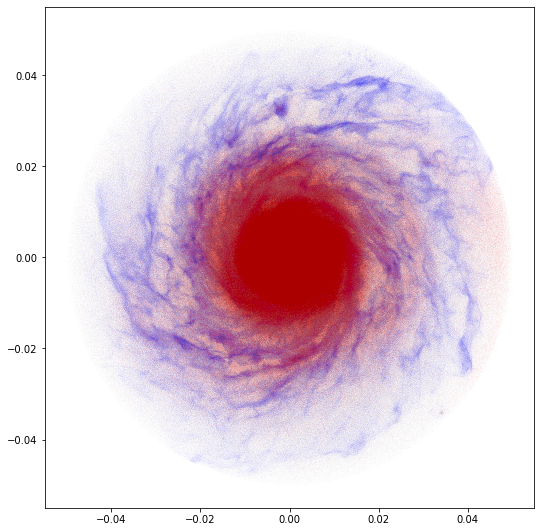

In [64]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xn_drk,yn_drk,'.k',markersize=0.005)
ax.plot(xn_gas,yn_gas,'.b',markersize=0.008)
ax.plot(xn_str,yn_str,'.r',markersize=0.008)



CPU times: user 18.3 s, sys: 2.46 s, total: 20.7 s
Wall time: 1.25 s


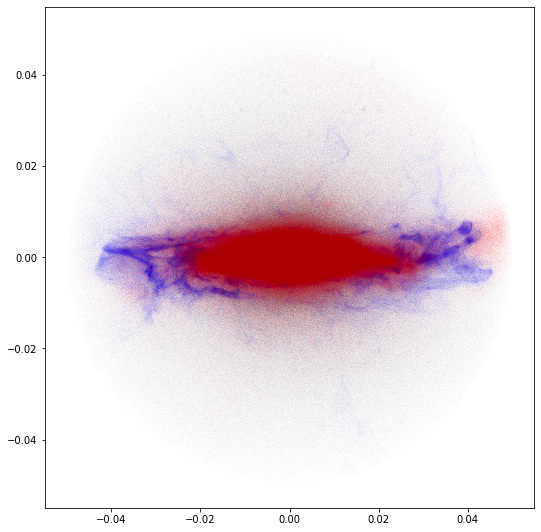

In [65]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xn_drk,zn_drk,'.k',markersize=0.005)
ax.plot(xn_gas,zn_gas,'.b',markersize=0.008)
ax.plot(xn_str,zn_str,'.r',markersize=0.008)



## Tercer halo mas masivo 

In [70]:
CM3  = SPOS[2,:]
SUB3 = SMass[2]

print('mass=',SUB3,'CM=',CM3)

mass= 575789330000.0 CM= [46.974728 49.455475 51.771206]


In [71]:
xstr3 = pos_str[:,0]-CM3[0]
ystr3 = pos_str[:,1]-CM3[1]
zstr3 = pos_str[:,2]-CM3[2]

xdrk3 = pos_drk[:,0]-CM3[0]
ydrk3 = pos_drk[:,1]-CM3[1]
zdrk3 = pos_drk[:,2]-CM3[2]

xgas3 = pos_gas[:,0]-CM3[0]
ygas3 = pos_gas[:,1]-CM3[1]
zgas3 = pos_gas[:,2]-CM3[2]

In [72]:
rstr = np.sqrt(xstr3**2 + ystr3**2 + zstr3**2)
rdrk = np.sqrt(xdrk3**2 + ydrk3**2 + zdrk3**2)
rgas = np.sqrt(xgas3**2 + ygas3**2 + zgas3**2)

mask_str, = np.where(rstr<0.25)
mask_drk, = np.where(rdrk<0.25)
mask_gas, = np.where(rgas<0.25)

CPU times: user 19.6 s, sys: 4.25 s, total: 23.8 s
Wall time: 3.42 s


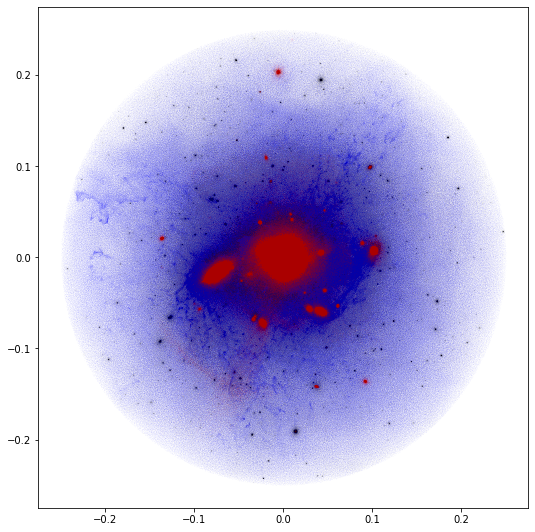

In [73]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xdrk3[mask_drk],ydrk3[mask_drk],'.k',markersize=0.005)
ax.plot(xgas3[mask_gas],ygas3[mask_gas],'.b',markersize=0.008)
ax.plot(xstr3[mask_str],ystr3[mask_str],'.r',markersize=0.008)


In [74]:
rstr = np.sqrt(xstr3**2 + ystr3**2 + zstr3**2)
rdrk = np.sqrt(xdrk3**2 + ydrk3**2 + zdrk3**2)
rgas = np.sqrt(xgas3**2 + ygas3**2 + zgas3**2)

mask_str, = np.where(rstr<0.05)
mask_drk, = np.where(rdrk<0.05)
mask_gas, = np.where(rgas<0.05)

In [75]:
import rotation_mio as rot

mstr = MASS4[mask_str]
v_x = vel_str[:,0][mask_str]
v_y = vel_str[:,1][mask_str]
v_z = vel_str[:,2][mask_str]

veloc,=np.where(rstr[mask_str]<0.005)

#----------componentes de la velocidad del centro de masa------------
vxcm = sum(mstr[veloc]*v_x[veloc])/sum(mstr[veloc])
vycm = sum(mstr[veloc]*v_y[veloc])/sum(mstr[veloc])
vzcm = sum(mstr[veloc]*v_z[veloc])/sum(mstr[veloc])

#----- velocidades de las estrellas respecto del centro de masa de la galaxia---------
vx = v_x - vxcm
vy = v_y - vycm
vz = v_z - vzcm

e1x,e2x,e3x,e1y,e2y,e3y,e1z,e2z,e3z = rot.rot1(mstr,xstr3[mask_str],ystr3[mask_str],zstr3[mask_str],vx,vy,vz,0.005)

xn_str = e1x*xstr3[mask_str] + e1y*ystr3[mask_str] + e1z*zstr3[mask_str]
yn_str = e2x*xstr3[mask_str] + e2y*ystr3[mask_str] + e2z*zstr3[mask_str]
zn_str = e3x*xstr3[mask_str] + e3y*ystr3[mask_str] + e3z*zstr3[mask_str]
# vxn_str = e1x*vx[mask_str] + e1y*vy[mask_str] + e1z*vz[mask_str]
# vyn_str = e2x*vx[mask_str] + e2y*vy[mask_str] + e2z*vz[mask_str]
# vzn_str = e3x*vx[mask_str] + e3y*vy[mask_str] + e3z*vz[mask_str]

xn_gas = e1x*xgas3[mask_gas] + e1y*ygas3[mask_gas] + e1z*zgas3[mask_gas]
yn_gas = e2x*xgas3[mask_gas] + e2y*ygas3[mask_gas] + e2z*zgas3[mask_gas]
zn_gas = e3x*xgas3[mask_gas] + e3y*ygas3[mask_gas] + e3z*zgas3[mask_gas]

xn_drk = e1x*xdrk3[mask_drk] + e1y*ydrk3[mask_drk] + e1z*zdrk3[mask_drk]
yn_drk = e2x*xdrk3[mask_drk] + e2y*ydrk3[mask_drk] + e2z*zdrk3[mask_drk]
zn_drk = e3x*xdrk3[mask_drk] + e3y*ydrk3[mask_drk] + e3z*zdrk3[mask_drk]

#  z = a0/aexp[isnap] - 1.
#         Ht = H0*np.sqrt(omega_lambda+(1-omega0)*(1+z)**2+omega_matter*(1+z)**3)
#         time = tiempo.conv(z, h, omega_lambda, omega_matter)
        
# #---aca paso las coordenadas respecto al centro de la galaxia------
#         xstr = (pstr[:,0]-cm[0])*aexp[isnap]/h
#         ystr = (pstr[:,1]-cm[1])*aexp[isnap]/h
#         zstr = (pstr[:,2]-cm[2])*aexp[isnap]/h
#         r = np.sqrt(xstr**2+ystr**2+zstr**2)
         
#         v_x = vel[:,0] *np.sqrt(aexp[isnap]) + Ht *xstr/1000.
#         v_y = vel[:,1] *np.sqrt(aexp[isnap]) + Ht *ystr/1000.
#         v_z = vel[:,2] *np.sqrt(aexp[isnap]) + Ht *zstr/1000.

CPU times: user 17.8 s, sys: 2.05 s, total: 19.9 s
Wall time: 878 ms


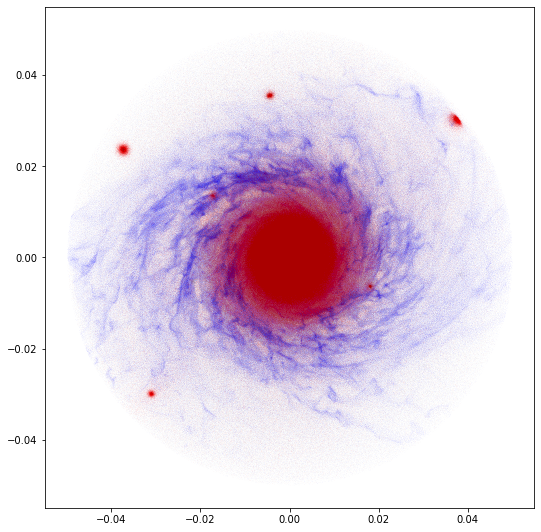

In [76]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xn_drk,yn_drk,'.k',markersize=0.005)
ax.plot(xn_gas,yn_gas,'.b',markersize=0.008)
ax.plot(xn_str,yn_str,'.r',markersize=0.008)



CPU times: user 17.6 s, sys: 2.16 s, total: 19.8 s
Wall time: 815 ms


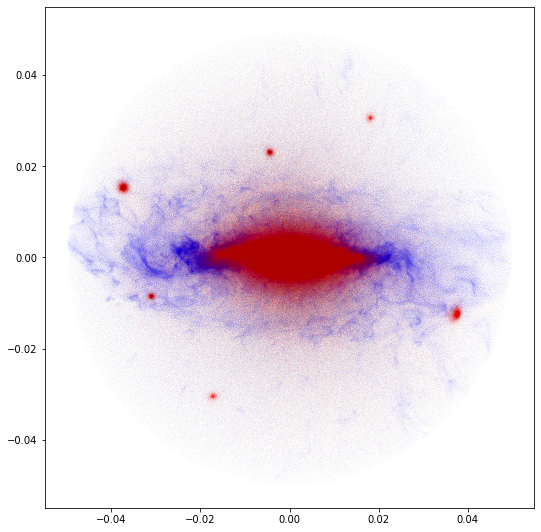

In [77]:
%%time
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax.plot(xn_drk,zn_drk,'.k',markersize=0.005)
ax.plot(xn_gas,zn_gas,'.b',markersize=0.008)
ax.plot(xn_str,zn_str,'.r',markersize=0.008)



# Vemos los histogramas de las masas

In [31]:
%%time
import gc
import joblib
import h5py
import pathlib

dir_path = pathlib.Path('/store/clues/HESTIA/RE_SIMS/8192/GAL_FOR/17_11/output_2x2.5Mpc/snapdir_127')


def load(path):
    with h5py.File(path,'r') as snap:
        Mass0 = snap['PartType0/Masses'][()]
        Mass1 = snap['PartType1/Masses'][()]
        Mass2 = snap['PartType2/Masses'][()]
        Mass3 = snap['PartType3/Masses'][()]
        Mass4 = snap['PartType4/Masses'][()]
        Mass5 = snap['PartType5/Masses'][()]

    return {'M0': Mass0, 'M1': Mass1, 'M2': Mass2,'M3': Mass3,'M4': Mass4,'M5': Mass5}

with joblib.Parallel(n_jobs=1) as P:
    results = P(
        joblib.delayed(load)(path)
        for path in dir_path.glob('*.hdf5'))
    
# results = np.vstack(results)
gc.collect()

CPU times: user 1.59 s, sys: 1.9 s, total: 3.49 s
Wall time: 5.77 s


10670

In [32]:
%%time
import numpy as np
MASS0 = np.concatenate([r['M0']for r in results])
MASS1 = np.concatenate([r['M1']for r in results])
MASS2 = np.concatenate([r['M2']for r in results])
MASS3 = np.concatenate([r['M3']for r in results])
MASS4 = np.concatenate([r['M4']for r in results])
MASS5 = np.concatenate([r['M5']for r in results])


CPU times: user 17.2 s, sys: 4.36 s, total: 21.6 s
Wall time: 704 ms


Text(0.5, 1.0, 'BH')

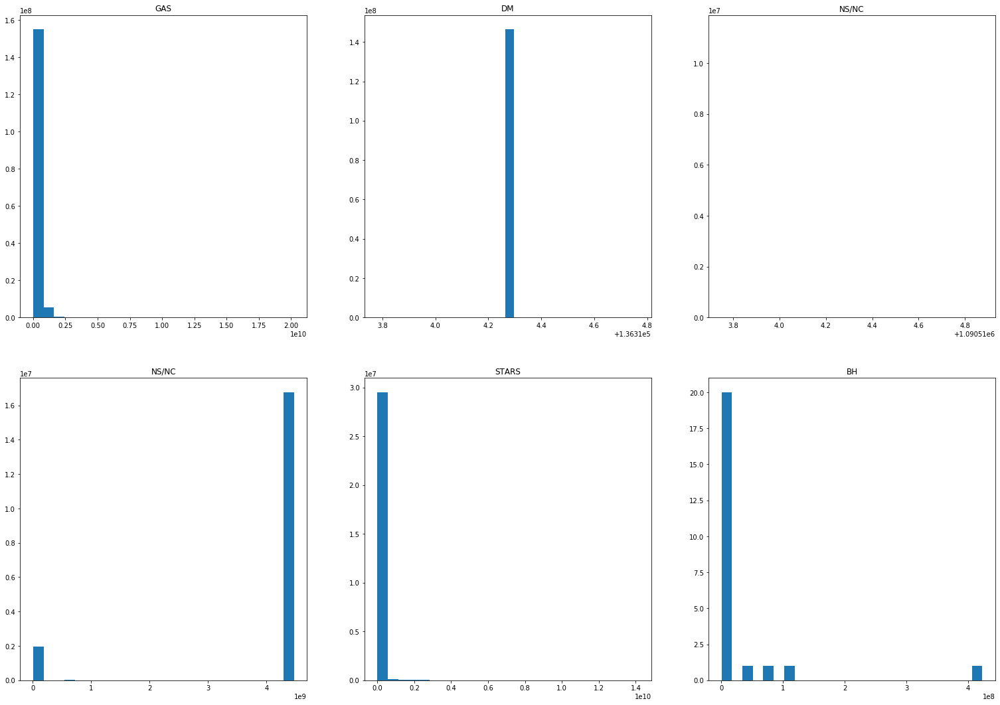

In [33]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(24, 16))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax[0,0].hist(MASS0*1e10,bins=25)
ax[0,0].set_title('GAS')

ax[0,1].hist(MASS1*1e10,bins=25)
ax[0,1].set_title('DM')

ax[0,2].hist(MASS2*1e10,bins=25)
ax[0,2].set_title('NS/NC')

ax[1,0].hist(MASS3*1e10,bins=25)
ax[1,0].set_title('NS/NC')

ax[1,1].hist(MASS4*1e10,bins=25)
ax[1,1].set_title('STARS')

ax[1,2].hist(MASS5*1e10,bins=25)
ax[1,2].set_title('BH')




In [34]:
MASS0*1e10

array([22251.547, 18033.79 , 18042.361, ..., 20680.863, 30331.514,
       27699.934], dtype=float32)

In [35]:
MASS1*1e10

array([136314.28, 136314.28, 136314.28, ..., 136314.28, 136314.28,
       136314.28], dtype=float32)

In [36]:
MASS4*1e10

array([11857.988, 10214.846, 17880.154, ..., 13042.379, 18149.684,
       16644.602], dtype=float32)

In [37]:
MASS2*1e10

array([1090514.2, 1090514.2, 1090514.2, ..., 1090514.2, 1090514.2,
       1090514.2], dtype=float32)

In [38]:
MASS3*1e10

array([4.4667464e+09, 4.4667464e+09, 4.4667464e+09, ..., 4.4667464e+09,
       4.4667464e+09, 4.4667464e+09], dtype=float32)

In [1]:
%%time
import gc
import joblib
import h5py
import pathlib
import numpy as np 


dir_path = '/store/clues/HESTIA/RE_SIMS/8192/GAL_FOR/17_11/output_2x2.5Mpc/groups_127/'

SubhMass = []
SubhPos  = []
SubhMTy  = []
SubhR50  = []

for i in range(0,8):
    
    snap = h5py.File(dir_path + 'fof_subhalo_tab_127.'+ str('%s'%i) +'.hdf5','r')

    sub_mass = snap['Subhalo/SubhaloMass'][()]
    sub_pos  = snap['Subhalo/SubhaloPos'][()]
    sub_mty  = snap['Subhalo/SubhaloMassType'][()]
    sub_r50  = snap['Subhalo/SubhaloHalfmassRad'][()]

    SubhMass.append(sub_mass)
    SubhPos.append(sub_pos)
    SubhMTy.append(sub_mty)
    SubhR50.append(sub_r50)

SubhMass = np.concatenate(SubhMass)
SubhPos  = np.concatenate(SubhPos)
SubhMTy  = np.concatenate(SubhMTy)
SubhR50  = np.concatenate(SubhR50)

gc.collect()

CPU times: user 249 ms, sys: 230 ms, total: 479 ms
Wall time: 1.16 s


0

In [2]:
import numpy as np

print (np.shape(SubhPos))

sort = np.argsort(SubhMass)

SMass = SubhMass[sort][::-1]*1e10
SMTy  = SubhMTy[sort][::-1]*1e10
SR50  = SubhR50[sort][::-1]

print (SMass[:10])
print (SMTy[:10])
print (SR50[:10])

(81461, 3)
[1.5752759e+12 1.1699873e+12 5.7578933e+11 5.5521280e+11 2.3570245e+11
 1.8116307e+11 1.6131521e+11 1.4867379e+11 1.4413586e+11 1.4381996e+11]
[[1.10465729e+11 1.38343245e+12 0.00000000e+00 0.00000000e+00
  8.12707922e+10 1.06893328e+08 0.00000000e+00]
 [5.62114560e+10 1.03561803e+12 0.00000000e+00 0.00000000e+00
  7.81197230e+10 3.81372840e+07 0.00000000e+00]
 [6.23428690e+10 3.93908191e+11 0.00000000e+00 0.00000000e+00
  1.19115170e+11 4.23098592e+08 0.00000000e+00]
 [4.31543788e+10 4.82571387e+11 0.00000000e+00 0.00000000e+00
  2.94764728e+10 1.05639230e+07 0.00000000e+00]
 [2.00611615e+10 2.02057843e+11 0.00000000e+00 0.00000000e+00
  1.35750205e+10 8.42748100e+06 0.00000000e+00]
 [1.68133530e+10 1.51495737e+11 0.00000000e+00 0.00000000e+00
  1.28446607e+10 9.31647900e+06 0.00000000e+00]
 [1.71730565e+10 1.35264256e+11 0.00000000e+00 0.00000000e+00
  8.87177728e+09 6.11738700e+06 0.00000000e+00]
 [1.81018071e+10 1.24038636e+11 0.00000000e+00 0.00000000e+00
  6.53002496e+

In [3]:
for i in range(10):
    MassSum = SMTy[i,0]+SMTy[i,1]+SMTy[i,4]+SMTy[i,5]
    print ('subhalo',str('%03d'%i),'SubhMass','{:e}'.format(SMass[i]),'{:e}'.format(MassSum))

subhalo 000 SubhMass 1.575276e+12 1.575276e+12
subhalo 001 SubhMass 1.169987e+12 1.169987e+12
subhalo 002 SubhMass 5.757893e+11 5.757893e+11
subhalo 003 SubhMass 5.552128e+11 5.552128e+11
subhalo 004 SubhMass 2.357025e+11 2.357025e+11
subhalo 005 SubhMass 1.811631e+11 1.811631e+11
subhalo 006 SubhMass 1.613152e+11 1.613152e+11
subhalo 007 SubhMass 1.486738e+11 1.486738e+11
subhalo 008 SubhMass 1.441359e+11 1.441359e+11
subhalo 009 SubhMass 1.438200e+11 1.438200e+11


In [4]:
H_pos = SubhPos[sort][::-1]
print (H_pos[:10])

[[48.81521  46.704514 53.605064]
 [48.71576  47.06235  53.33718 ]
 [46.974728 49.455475 51.771206]
 [47.528534 46.364803 54.832882]
 [47.325207 47.259197 51.91327 ]
 [47.791496 47.55743  53.327   ]
 [47.41012  48.306732 52.663097]
 [49.867104 47.25419  52.225414]
 [45.62381  46.928238 54.103687]
 [48.525105 48.03401  51.99552 ]]


In [5]:
%%time
import gc
import joblib
import h5py
import pathlib
import numpy as np

dir_path = '/store/clues/HESTIA/RE_SIMS/8192/GAL_FOR/17_11/output_2x2.5Mpc/snapdir_127/'

StrPos  = []
StrMass = []

GasPos  = []
GasMass = []

DrkPos  = []
DrkMass = []

Ty2Pos  = []
Ty2Mass = []

Ty3Pos  = []
Ty3Mass = []

for i in range(0,8):
    snap = h5py.File(dir_path + 'snapshot_127.'+ str('%s'%i) +'.hdf5','r')
    
    #stars
    pos_str    = snap['PartType4/Coordinates'][()]
    mass_str   = snap['PartType4/Masses'][()]
   
    StrPos.append(pos_str)
    StrMass.append(mass_str)

    #gas
    pos_gas    = snap['PartType0/Coordinates'][()]
    mass_gas   = snap['PartType0/Masses'][()]
    
    GasPos.append(pos_gas)
    GasMass.append(mass_gas)

    #dark matter
    pos_drk    = snap['PartType1/Coordinates'][()]
    mass_drk   = snap['PartType1/Masses'][()]
    
    DrkPos.append(pos_drk)
    DrkMass.append(mass_drk)

    #type2
    pos_ty2  = snap['PartType2/Coordinates'][()]
    mass_ty2 = snap['PartType2/Masses'][()]
    
    Ty2Pos.append(pos_ty2)
    Ty2Mass.append(mass_ty2)

    #type3
    pos_ty3  = snap['PartType3/Coordinates'][()]
    mass_ty3 = snap['PartType3/Masses'][()]
    
    Ty3Pos.append(pos_ty3)
    Ty3Mass.append(mass_ty3)
    
a = snap.get('Header').attrs['Time']
h = snap.get('Header').attrs['HubbleParam']

Omega0   = snap.get('Header').attrs['Omega0']
Omegab   = snap.get('Header').attrs['OmegaBaryon']
OmegaL   = snap.get('Header').attrs['OmegaLambda']
Redshift = snap.get('Header').attrs['Redshift']

Unit_Length = snap.get('Header').attrs['UnitLength_in_cm']
Unit_Mass   = snap.get('Header').attrs['UnitMass_in_g']
Unit_Veloc  = snap.get('Header').attrs['UnitVelocity_in_cm_per_s']

StrPos  = np.concatenate(StrPos)
StrMass = np.concatenate(StrMass)

GasPos  = np.concatenate(GasPos)
GasMass = np.concatenate(GasMass)

DrkPos  = np.concatenate(DrkPos)
DrkMass = np.concatenate(DrkMass)

Ty2Pos  = np.concatenate(Ty2Pos)
Ty2Mass = np.concatenate(Ty2Mass)

Ty3Pos  = np.concatenate(Ty3Pos)
Ty3Mass = np.concatenate(Ty3Mass)

gc.collect()

CPU times: user 56.7 s, sys: 19.8 s, total: 1min 16s
Wall time: 7.43 s


0

In [6]:
# path2 = '/home/omarioni/gradients/_data/'
# archivo =  open(path2 + 'subhalos.dat','a')

for j in range(100):
#     print ('subhalo=',str('%03d'%j))
    
    SPos = (StrPos - H_pos[j,:])*1000
    xstr = SPos[:,0]
    ystr = SPos[:,1]
    zstr = SPos[:,2]
    rstr = np.sqrt(xstr**2 + ystr**2 + zstr**2)
    kstr, = np.where(rstr < 3*SR50[j]*1000)
    
    GPos = (GasPos - H_pos[j,:])*1000
    xgas = GPos[:,0]
    ygas = GPos[:,1]
    zgas = GPos[:,2]
    rgas = np.sqrt(xgas**2 + ygas**2 + zgas**2)
    kgas,= np.where(rgas < 3*SR50[j]*1000)
    
    DPos = (DrkPos - H_pos[j,:])*1000
    xdrk = DPos[:,0]
    ydrk = DPos[:,1]
    zdrk = DPos[:,2]
    rdrk = np.sqrt(xdrk**2 + ydrk**2 + zdrk**2)
    kdrk,= np.where(rdrk < 3*SR50[j]*1000)
    
    T2Pos = (Ty2Pos - H_pos[j,:])*1000
    xty2 = T2Pos[:,0]
    yty2 = T2Pos[:,1]
    zty2 = T2Pos[:,2]
    rty2 = np.sqrt(xty2**2 + yty2**2 + zty2**2)
    kty2,= np.where(rty2 < 3*SR50[j]*1000)
#     print ('Number of PartType2=', len(kty2))
    
    T3Pos = (Ty3Pos - H_pos[j,:])*1000
    xty3 = T3Pos[:,0]
    yty3 = T3Pos[:,1]
    zty3 = T3Pos[:,2]
    rty3 = np.sqrt(xty3**2 + yty3**2 + zty3**2)
    kty3,= np.where(rty3 < 3*SR50[j]*1000)
#     print ('Number of PartType3=', len(kty3))
    
    Sr50 = SR50[j]*1000
    
    archivo.write(str('%03d'%j ) +'\t'+
             str('%1.4e'% SMass[j]) +'\t'+
             str('%1.4e'% SMTy[j,0]) +'\t'+
             str('%1.4e'% SMTy[j,1]) +'\t'+
             str('%1.4e'% SMTy[j,2]) +'\t'+
             str('%1.4e'% SMTy[j,3]) +'\t'+
             str('%1.4e'% SMTy[j,4]) +'\t'+
             str('%1.4e'% SMTy[j,5]) +'\t'+
             str('%1.4e'% SMTy[j,6]) +'\t'+
             str('%4.4f'% Sr50) +'\t'+
             str('%4.4f'% H_pos[j,0]) +'\t'+
             str('%4.4f'% H_pos[j,1]) +'\t'+
             str('%4.4f'% H_pos[j,2]) +'\t'+
             str('%10i'% len(kgas)) +'\t'+
             str('%10i'% len(kdrk)) +'\t'+
             str('%10i'% len(kty2)) +'\t'+
             str('%10i'% len(kty3)) +'\t'+
             str('%10i'% len(kstr)) +'\n')
archivo.close()


In [6]:
import numpy as np
subh = np.loadtxt('../_data/subhalos.dat')
halo_mask, = np.where((subh[:,15]==0) & (subh[:,16]==0))
subh_name = subh[:,0][halo_mask]
halo_ind = np.int_(subh_name)
print(halo_ind)
print(len(subh_name))

[ 0  1  3  4  5  6  7  9 20 21 22 27 28 31 33 35 36 37 38 39 41 42 45 46
 49 50 51 53 54 64 65 66 69 73 74 79 84 85 87 88 90 91 92 95 96]
45


In [7]:
xstr = StrPos[:,0]
ystr = StrPos[:,1]
zstr = StrPos[:,2]
mask_str, = np.where((xstr<55) & (xstr>42) & (ystr<55) & (ystr>40) & (zstr<62) & (zstr>48))

xdrk = DrkPos[:,0]
ydrk = DrkPos[:,1]
zdrk = DrkPos[:,2]
mask_drk, = np.where((xdrk<55) & (xdrk>42) & (ydrk<55) & (ydrk>40) & (zdrk<62) & (zdrk>48))

xgas = GasPos[:,0]
ygas = GasPos[:,1]
zgas = GasPos[:,2]
mask_gas, = np.where((xgas<55) & (xgas>42) & (ygas<55) & (ygas>40) & (zgas<62) & (zgas>48))

xty2 = Ty2Pos[:,0]
yty2 = Ty2Pos[:,1]
zty2 = Ty2Pos[:,2]
mask_ty2, = np.where((xty2<55) & (xty2>42) & (yty2<55) & (yty2>40) & (zty2<62) & (zty2>48))

xty3 = Ty3Pos[:,0]
yty3 = Ty3Pos[:,1]
zty3 = Ty3Pos[:,2]
mask_ty3, = np.where((xty3<55) & (xty3>42) & (yty3<55) & (yty3>40) & (zty3<62) & (zty3>48))



In [8]:
%%time
import random
import gc
adrk = random.choices(np.arange(len(xdrk[mask_drk])),k=np.int(len(xdrk[mask_drk])*0.005)) 
astr = random.choices(np.arange(len(xstr[mask_str])),k=np.int(len(xstr[mask_str])*0.005)) 
# agas = random.choices(np.arange(len(xgas[mask_gas])),k=np.int(len(xgas[mask_gas])*0.005)) 
gc.collect()

CPU times: user 2.97 s, sys: 1.16 s, total: 4.12 s
Wall time: 4.12 s


22

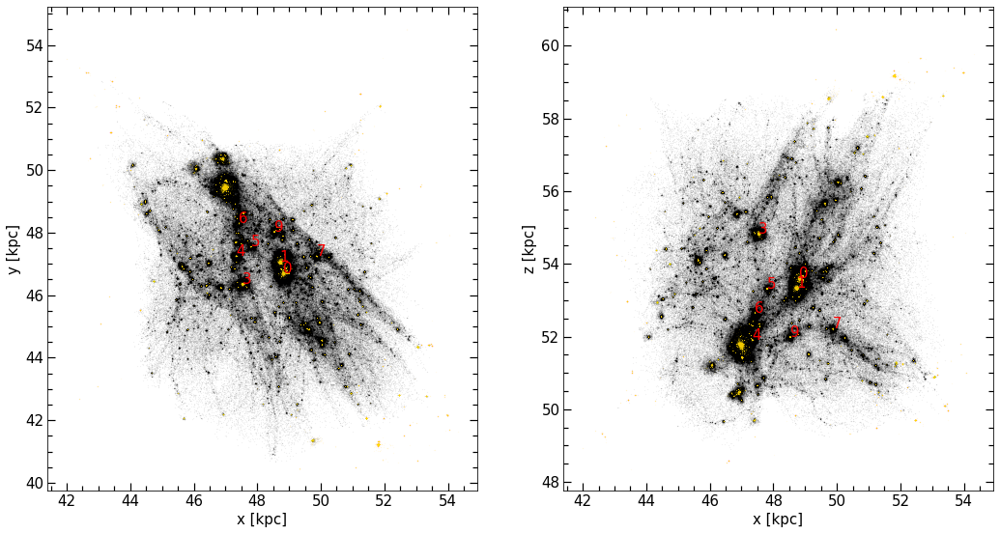

CPU times: user 32.9 s, sys: 2.77 s, total: 35.7 s
Wall time: 11.1 s


In [10]:
%%time 
import matplotlib.pyplot as plt

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
fig.subplots_adjust(bottom=0.10, left =0.12, right = 0.97, top = 0.97)

ax[0].plot(xdrk[mask_drk][adrk],ydrk[mask_drk][adrk],'.k',markersize=0.05,alpha=0.7)
ax[0].plot(xstr[mask_str][astr],ystr[mask_str][astr],'.',color='gold',markersize=0.05)
# ax[0].set_xlim(43,55)
# ax[0].set_ylim(48,60)
ax[0].set_xlabel('x [kpc]',fontsize=15)
ax[0].set_ylabel('y [kpc]',fontsize=15)
ax[0].minorticks_on()
ax[0].tick_params( labelsize=15)
ax[0].tick_params('both', length=5, width=1.2,which='minor', direction='in', right='on',top='on')
ax[0].tick_params('both', length=8, width=1.2,which='major', direction='in', right='on',top='on')

for i in range(0,8):
    ax[0].text(H_pos[halo_ind[i],0],H_pos[halo_ind[i],1],str('%s'%halo_ind[i]),fontsize=15,color='r')
    ax[1].text(H_pos[halo_ind[i],0],H_pos[halo_ind[i],2],str('%s'%halo_ind[i]),fontsize=15,color='r')
#     ax.text(G_Pos[i,0],G_Pos[i,1],str('%s'%i),fontsize=18,color='b')
#     circle1= plt.Circle((G_Pos[i,0],G_Pos[i,1]),radius=Gr200[i],lw=3,ls='-',color='k',alpha=0.5)
#     ax.add_artist(circle1)

ax[1].plot(xdrk[mask_drk][adrk],zdrk[mask_drk][adrk],'.k',markersize=0.05,alpha=0.7)
ax[1].plot(xstr[mask_str][astr],zstr[mask_str][astr],'.',color='gold',markersize=0.05)
ax[1].set_xlabel('x [kpc]',fontsize=15)
ax[1].set_ylabel('z [kpc]',fontsize=15)
# ax[1].set_xlim(43,55)
# ax[1].set_ylim(48,60)
ax[1].minorticks_on()
ax[1].tick_params( labelsize=15)
ax[1].tick_params('both', length=5, width=1.2,which='minor', direction='in', right='on',top='on')
ax[1].tick_params('both', length=8, width=1.2,which='major', direction='in', right='on',top='on')

plt.show()
fig.savefig('../_imagenes/subhalos.png', dpi = 100, xxbox_inches='tight')